## Overview

Individuals’ quality of life is influenced by a variety of factors, including genetics, lifestyle choices, access to healthcare, and environmental conditions. Cardiovascular health is a critical element that often goes unrecognized. Heart disease has become a global concern, affecting the health of millions. They discourage people from leading active lives, pursuing their passions, and contributing to society successfully. When cardiovascular problems appear, they not only become difficult to manage, but they also inflict significant financial and emotional pressures on families and healthcare systems. Despite medical advances, there is no universal agreement on preventative strategies.

This assignment focused on the prediction and understanding of heart disorders. We specifically used a dataset compiled from a We investigated, evaluated, and built models for a dataset containing health indicators and behaviors of around 4,238 people, with a focus on factors potentially contributing to heart disease.

We began by scanning the dataset for potential problems such as missing values, abnormalities, and suspected collinearity among predictors. Following the initial inspection, we began the data purification process, correcting the highlighted concerns.

With the improved information in hand, we built SVM model leveraging its ability to find best boundary (or hyperplane) that separates the data into different classes. We tested our model’s performance against a predefined evaluation set after training them. After doing our research, we compared the use of decision trees from the previous assignment with the current SVM model. Based on health measurements and behaviors, this model attempts to estimate the chance of a person having a heart attack.

R code for this project: https://rpubs.com/exprmcg/1119098

## 1. Data Preparation

### 1.1 Summary Statistics
The dataset contained 4238 observations of 16 predictor variables.

Each record represented a patient, and each column represented a health aspect. The Heart_ stroke was the target, it specified whether or not the patient experienced a stroke. Specifically:

Gender: Gender of the patient (Male, Female)
age: Age of the patient
education: Education of the patient (Uneducated, Primary School, Graduate, Postgraduate)
current smoker: “1” if the patient is smoking, “0” otherwise
cigsperDay: Number of cigarettes per day
BPMeds: “1” if the patient is on a blood pressure medication, “0” otherwise
prevalentStroke: “1” if the patient has a history of stroke, “0” otherwise
prevalentHyp: “1” if the patient has prevalent hypertension, “0” otherwise
diabetes: “1” if the patient has diabetes, “0” otherwise
totChol: Total cholesterol level
sysBP: Systolic blood pressure
diaBP: Diastolic blood pressure
BMI: Body Mass Index
heartRate: Heart rate of the patient
glucose: Glucose level of the patient
Heart_ stroke: “1” if the patient had a heart stroke, “0” otherwise
As the target variable was binary, the following algorithms were considered. The following data preparation was based on this algorithm selection. The choice of the algorithm wasn’t affected by the size of the data, only by the nature of the target variable and the assignment.

Support Vector Machine: it performs reasonably well when there is a distinct margin of difference between classes, one of the best choices for spaces with high dimensions, computationally effective. On the other hand, we should remember that large data sets are not a good fit for the SVM algorithm, it doesn’t perform well with noisy data and if there are more features per data point than there are training data samples.

The data source: https://www.kaggle.com/datasets/mirzahasnine/heart-disease-dataset/data

In [ ]:
# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from imblearn.over_sampling import SMOTE
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score
import joblib
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score
#%pip install boto3
import boto3
from ydata_profiling import ProfileReport
from sqlalchemy import create_engine
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset

In [ ]:
# Load data
url = "https://raw.githubusercontent.com/ex-pr/DATA_622/main/HW%202/heart_disease.csv"
data = pd.read_csv(url)

# Display first few rows
print(data.head())

   Gender  age      education  currentSmoker  cigsPerDay  BPMeds  \
0    Male   39   postgraduate              0         0.0     0.0   
1  Female   46  primaryschool              0         0.0     0.0   
2    Male   48     uneducated              1        20.0     0.0   
3  Female   61       graduate              1        30.0     0.0   
4  Female   46       graduate              1        23.0     0.0   

  prevalentStroke  prevalentHyp  diabetes  totChol  sysBP  diaBP    BMI  \
0              no             0         0    195.0  106.0   70.0  26.97   
1              no             0         0    250.0  121.0   81.0  28.73   
2              no             0         0    245.0  127.5   80.0  25.34   
3              no             1         0    225.0  150.0   95.0  28.58   
4              no             0         0    285.0  130.0   84.0  23.10   

   heartRate  glucose Heart_ stroke  
0       80.0     77.0            No  
1       95.0     76.0            No  
2       75.0     70.0     

In [ ]:
# Save DataFrame to PostgreSQL
data.to_sql('heart_disease', engine, if_exists='replace', index=False)

# Load data from PostgreSQL
query = "SELECT * FROM heart_disease;"
df = pd.read_sql(query, engine)
print(df.head())

In [ ]:
# Initialize S3 client
s3 = boto3.client('s3', aws_access_key_id='YOUR_ACCESS_KEY', aws_secret_access_key='YOUR_SECRET_KEY')

# Load data from S3
obj = s3.get_object(Bucket='my-bucket', Key='heart_disease.csv')
data_s3 = pd.read_csv(obj['Body'])

# Display first few rows
print(data_s3.head())

The table below provided a summary statistics for the data. There were some missing values (<10%) to be imputed.

The dataset contained more female observations than males. Patients ranged in age from 32 to 70 years old, with an average age of 49.6 years. Nearly half of the people in the dataset (49.4%) were smokers. The average number of cigarettes smoked per day is 9, yet this varied from non-smokers to heavy smokers who consumed up to 70 cigarettes per day.

The average systolic blood pressure was 132.35, while the average diastolic blood pressure was 82.89. Almost 2.96% of the participants were taking blood pressure medication. The average total cholesterol level was approximately 236.72, with values ranging from 107 to 696. The average BMI was 25.8, and the average glucose level was around 81.97.

About 31.1% of people had hypertension, while a minor percentage (2.57%) had diabetes. Only a small percentage of participants (less than 1%) had a history of stroke, indicating that it was uncommon in our sample. A significant fraction of patients was classified as “uneducated,” while primary school students and postgraduates were also represented.

The vast majority of the individuals in the dataset had never had a strokeas the target variable indicated. The imbalance in the target variable was fixed further.

In [ ]:
summary_stats = data.describe()

# Add additional statistics (e.g., median, mode)
summary_stats.loc['median'] = data.median(numeric_only=True)
summary_stats.loc['mode'] = data.mode().iloc[0]

print(summary_stats)

                age  currentSmoker   cigsPerDay       BPMeds  prevalentHyp  \
count   4238.000000    4238.000000  4209.000000  4185.000000   4238.000000   
mean      49.584946       0.494101     9.003089     0.029630      0.310524   
std        8.572160       0.500024    11.920094     0.169584      0.462763   
min       32.000000       0.000000     0.000000     0.000000      0.000000   
25%       42.000000       0.000000     0.000000     0.000000      0.000000   
50%       49.000000       0.000000     0.000000     0.000000      0.000000   
75%       56.000000       1.000000    20.000000     0.000000      1.000000   
max       70.000000       1.000000    70.000000     1.000000      1.000000   
median    49.000000       0.000000     0.000000     0.000000      0.000000   
mode      40.000000       0.000000     0.000000     0.000000      0.000000   

           diabetes      totChol        sysBP        diaBP          BMI  \
count   4238.000000  4188.000000  4238.000000  4238.000000  4219.0

In [ ]:
# Count unique values for categorical columns
categorical_columns = ['Gender', 'education', 'prevalentStroke', 'Heart_ stroke']
for col in categorical_columns:
    print(f"Unique values in {col}:")
    print(data[col].value_counts())
    print()

Unique values in Gender:
Gender
Female    2419
Male      1819
Name: count, dtype: int64

Unique values in education:
education
uneducated       1720
primaryschool    1253
graduate          687
postgraduate      473
Name: count, dtype: int64

Unique values in prevalentStroke:
prevalentStroke
no     4213
yes      25
Name: count, dtype: int64

Unique values in Heart_ stroke:
Heart_ stroke
No     3594
yes     644
Name: count, dtype: int64



In [ ]:
# Generate a detailed summary report
profile = ProfileReport(data, title="Heart Disease Dataset Summary")

# Save the report to an HTML file
profile.to_file("heart_disease_summary.html")

# Display the report in a Jupyter Notebook
profile.to_widgets()

### 1.2 Missing values
Managing missing values was one of the critical problems to fix before building the models.

The missing values for continuous variables cigsPerDay, BMI, totChol. heartRate and glucose were imputed using the median value of their respective columns. Using the median rather than the mean reduced the impact of any outliers in the data.

To fill in the missing data points for categorical variables, such as education and BPMeds, the mode (most often occurring value) of each column was used. This method assured that the categorical data distribution was preserved and that no unintentional biases were introduced.

In [ ]:
# Check for missing values
print(data.isnull().sum())

Gender               0
age                  0
education          105
currentSmoker        0
cigsPerDay          29
BPMeds              53
prevalentStroke      0
prevalentHyp         0
diabetes             0
totChol             50
sysBP                0
diaBP                0
BMI                 19
heartRate            1
glucose            388
Heart_ stroke        0
dtype: int64


In [ ]:
# Fill missing numerical values with median
numerical_columns = ['cigsPerDay', 'totChol', 'BMI', 'heartRate', 'glucose']
data[numerical_columns] = data[numerical_columns].fillna(data[numerical_columns].median())

# Fill missing categorical values with mode
categorical_columns = ['education', 'BPMeds']
for col in categorical_columns:
    data[col].fillna(data[col].mode()[0], inplace=True)

# Verify no missing values remain
print(data.isnull().sum())

Gender             0
age                0
education          0
currentSmoker      0
cigsPerDay         0
BPMeds             0
prevalentStroke    0
prevalentHyp       0
diabetes           0
totChol            0
sysBP              0
diaBP              0
BMI                0
heartRate          0
glucose            0
Heart_ stroke      0
dtype: int64


<ipython-input-13-3c5b2c1b77f7>:8: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[col].fillna(data[col].mode()[0], inplace=True)


### 1.3 Encoding

We assured that our dataset was appropriate for a broader range of algorithms that require numerical input by using one-hot encoding, boosting the potential accuracy and effectiveness of our later analysis.

Gender, 'education, and prevalentStroke were recognized as categorical columns that would benefit from one-hot encoding.

The encoding of Gender resulted in a new column male, where a value of 1 indicated a male and a value of 0 indicated a female.

The encoding of prevalentStroke resulted in a new column prevalStroke, where a value of 1 indicated if a patient had a previous stroke, 0 indicated a patient without a previous stroke.

The encoding of the target variable Heart_.stroke resulted in a new column stroke, where a value of 1 indicated if a patient had a stroke, 0 indicated a patient without a stroke.

Three new columns were created for education: postgraduate, primaryschool, and uneducated. Each of these columns accepted a binary value, indicating whether the education level was present (1) or absent (0).

The first category of each original categorical variable was eliminated throughout the encoding procedure to avoid multicollinearity and reduce redundancy.

In [ ]:
# One-hot encode categorical variables
data = pd.get_dummies(data, columns=['Gender', 'education', 'prevalentStroke'], drop_first=True)

# Rename columns for clarity
data.rename(columns={
    'Gender_Male': 'male',
    'prevalentStroke_yes': 'prevalStroke',
    'Heart_ stroke': 'stroke'
}, inplace=True)

# Display the first few rows
print(data.head())

   age  currentSmoker  cigsPerDay  BPMeds  prevalentHyp  diabetes  totChol  \
0   39              0         0.0     0.0             0         0    195.0   
1   46              0         0.0     0.0             0         0    250.0   
2   48              1        20.0     0.0             0         0    245.0   
3   61              1        30.0     0.0             1         0    225.0   
4   46              1        23.0     0.0             0         0    285.0   

   sysBP  diaBP    BMI  heartRate  glucose stroke   male  \
0  106.0   70.0  26.97       80.0     77.0     No   True   
1  121.0   81.0  28.73       95.0     76.0     No  False   
2  127.5   80.0  25.34       75.0     70.0     No   True   
3  150.0   95.0  28.58       65.0    103.0    yes  False   
4  130.0   84.0  23.10       85.0     85.0     No  False   

   education_postgraduate  education_primaryschool  education_uneducated  \
0                    True                    False                 False   
1                 

### 1.4 Column change

Several entries in the dataset, including diabetes, prevalentHyp, currentSmoker, BPMeds, postgraduate, primaryschool, uneducated were converted to categorical data types. This change was performed to better depict the variables’ inherent categorical character.

We included a new column called BP. This column represented the ratio of systolic to diastolic blood pressure (from the sysBP and diaBP columns respectively). This derived attribute could provide new insights on people’s cardiovascular health.

In [ ]:
# Create BP column
data['BP'] = data['sysBP'] / data['diaBP']

# Display the first few rows
print(data.head())

   age  currentSmoker  cigsPerDay  BPMeds  prevalentHyp  diabetes  totChol  \
0   39              0         0.0     0.0             0         0    195.0   
1   46              0         0.0     0.0             0         0    250.0   
2   48              1        20.0     0.0             0         0    245.0   
3   61              1        30.0     0.0             1         0    225.0   
4   46              1        23.0     0.0             0         0    285.0   

   sysBP  diaBP    BMI  heartRate  glucose stroke   male  \
0  106.0   70.0  26.97       80.0     77.0     No   True   
1  121.0   81.0  28.73       95.0     76.0     No  False   
2  127.5   80.0  25.34       75.0     70.0     No   True   
3  150.0   95.0  28.58       65.0    103.0    yes  False   
4  130.0   84.0  23.10       85.0     85.0     No  False   

   education_postgraduate  education_primaryschool  education_uneducated  \
0                    True                    False                 False   
1                 

In [ ]:
# Convert binary variables to categorical
binary_columns = ['diabetes', 'prevalentHyp', 'currentSmoker', 'BPMeds', 'male', 'education_postgraduate', 'education_primaryschool', 'education_uneducated', 'prevalStroke', 'stroke']
data[binary_columns] = data[binary_columns].astype('category')

# Display data types
print(data.dtypes)

age                           int64
currentSmoker              category
cigsPerDay                  float64
BPMeds                     category
prevalentHyp               category
diabetes                   category
totChol                     float64
sysBP                       float64
diaBP                       float64
BMI                         float64
heartRate                   float64
glucose                     float64
stroke                     category
male                       category
education_postgraduate     category
education_primaryschool    category
education_uneducated       category
prevalStroke               category
BP                          float64
dtype: object


### 1.5 Outliers
We used boxplots to detect outliers. Several variables, including cigsPerDay, totChol, sysBP, diaBP, BMI, heartRate, and glucose, appeared to have possible outliers as values that fell outside the whiskers of the boxplots. Several variables, including sysBP, glucose, and BP, had a disproportionately high number of outliers. These outliers could have a considerable impact on the outcomes, depending on the analytic or modeling technique used. Outliers in health data could represent actual and critical findings, and deleting them may result in the loss of vital information. An unusually high glucose level, for example, could indicate an untreated diabetes patient. By removing such outliers, important therapeutic insights would be lost. As a result, the ourliers were retained.

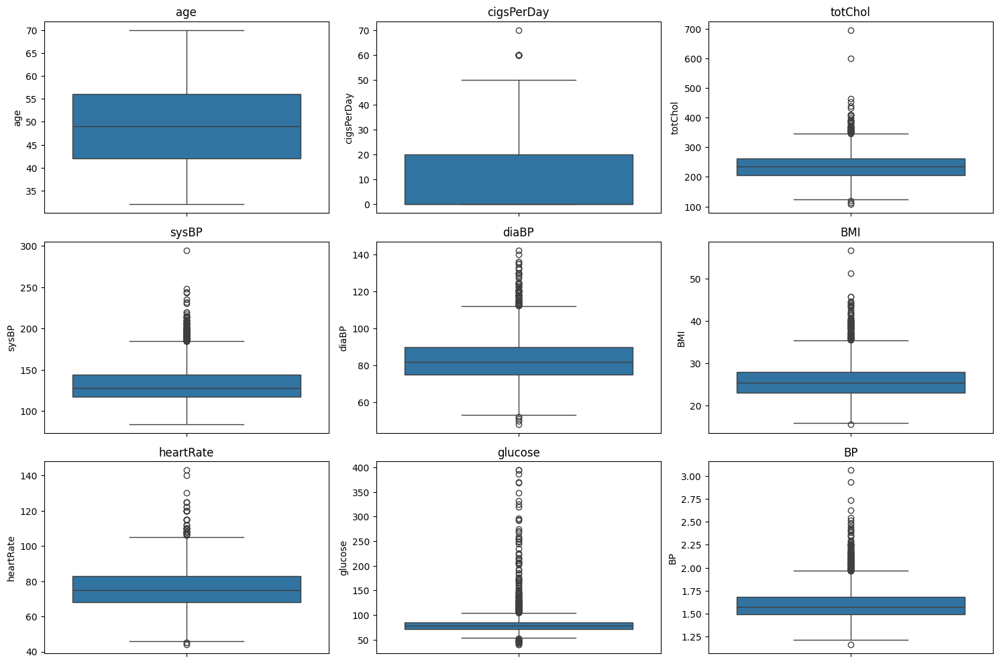

In [ ]:
# List of numerical columns
numerical_columns = ['age', 'cigsPerDay', 'totChol', 'sysBP', 'diaBP', 'BMI', 'heartRate', 'glucose', 'BP']

# Plot boxplots for numerical variables
plt.figure(figsize=(15, 10))
for i, col in enumerate(numerical_columns, 1):
    plt.subplot(3, 3, i)
    sns.boxplot(y=data[col])
    plt.title(col)
plt.tight_layout()
plt.show()

### 1.6 Summary Statistics for transformed data
After the data transformation, no missing values detected.

New columns were added (male, prevalStroke, stroke, BP, postgraduate, primaryschool, uneducated) while other were removed (Gender, education, Heart_stroke, prevalentStroke).

The mean for cigsPerDay had been reduced in the converted data because missing values were imputed using the median. totChol, sysBP, diaBP, BMI, heartRate, and glucose: These columns’ statistics changed slightly, owing to imputation of missing values with medians.

In [ ]:
summary_stats = data.describe()

# Add additional statistics (e.g., median, mode)
summary_stats.loc['median'] = data.median(numeric_only=True)
summary_stats.loc['mode'] = data.mode().iloc[0]

print(summary_stats)

                age   cigsPerDay      totChol        sysBP        diaBP  \
count   4238.000000  4238.000000  4238.000000  4238.000000  4238.000000   
mean      49.584946     8.941482   236.689476   132.352407    82.893464   
std        8.572160    11.902399    44.327427    22.038097    11.910850   
min       32.000000     0.000000   107.000000    83.500000    48.000000   
25%       42.000000     0.000000   206.000000   117.000000    75.000000   
50%       49.000000     0.000000   234.000000   128.000000    82.000000   
75%       56.000000    20.000000   262.000000   144.000000    89.875000   
max       70.000000    70.000000   696.000000   295.000000   142.500000   
median    49.000000     0.000000   234.000000   128.000000    82.000000   
mode      40.000000     0.000000   234.000000   120.000000    80.000000   

                BMI    heartRate      glucose           BP  
count   4238.000000  4238.000000  4238.000000  4238.000000  
mean      25.800205    75.878716    81.603587     1.

In [ ]:
# Count unique values for categorical columns
categorical_columns = ['diabetes', 'prevalentHyp', 'currentSmoker', 'BPMeds', 'male', 'education_postgraduate', 'education_primaryschool', 'education_uneducated', 'prevalStroke']
for col in categorical_columns:
    print(f"Unique values in {col}:")
    print(data[col].value_counts())
    print()

Unique values in diabetes:
diabetes
0    4129
1     109
Name: count, dtype: int64

Unique values in prevalentHyp:
prevalentHyp
0    2922
1    1316
Name: count, dtype: int64

Unique values in currentSmoker:
currentSmoker
0    2144
1    2094
Name: count, dtype: int64

Unique values in BPMeds:
BPMeds
0.0    4114
1.0     124
Name: count, dtype: int64

Unique values in male:
male
False    2419
True     1819
Name: count, dtype: int64

Unique values in education_postgraduate:
education_postgraduate
False    3765
True      473
Name: count, dtype: int64

Unique values in education_primaryschool:
education_primaryschool
False    2985
True     1253
Name: count, dtype: int64

Unique values in education_uneducated:
education_uneducated
False    2413
True     1825
Name: count, dtype: int64

Unique values in prevalStroke:
prevalStroke
False    4213
True       25
Name: count, dtype: int64



In [ ]:
# Check for missing values
print(data.isnull().sum())

age                        0
currentSmoker              0
cigsPerDay                 0
BPMeds                     0
prevalentHyp               0
diabetes                   0
totChol                    0
sysBP                      0
diaBP                      0
BMI                        0
heartRate                  0
glucose                    0
stroke                     0
male                       0
education_postgraduate     0
education_primaryschool    0
education_uneducated       0
prevalStroke               0
BP                         0
dtype: int64


In [ ]:
# Generate a detailed summary report
profile = ProfileReport(data, title="Heart Disease Dataset Summary")

# Save the report to an HTML file
profile.to_file("heart_disease_summary.html")

# Display the report in a Jupyter Notebook
profile.to_widgets()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/ydata_profiling/profile_report.py:528: UserWarning: Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60).As an alternative, you can use the HTML report. See the documentation for more information.
  warnings.warn(


Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

##2. Data Exploration

### 2.1 Continuous Variables

First, we checked the distribution of all continuous variables with the most patients between the ages of 40 to 60..

Age appeared to be rather evenly distributed, with a small left skew.

The distribution of cigsPerDay showed that the majority of people either did not smoke or smoked around 20 cigarettes per day.

totChol,sysBP, Glucose and diaBP were slightly skewed to the right, with most values centered around 200-300 mg/dL, 120 mmHg, 80 mmHg and 100 mg/d respectively.

BMI was tilted to the right, with the majority of readings falling between 20 and 30. The heart rate appeared to be rather normal, ranging between 70 and 80 beats per minute. BP was slightly biased to the right as well, with most values around 1.5.

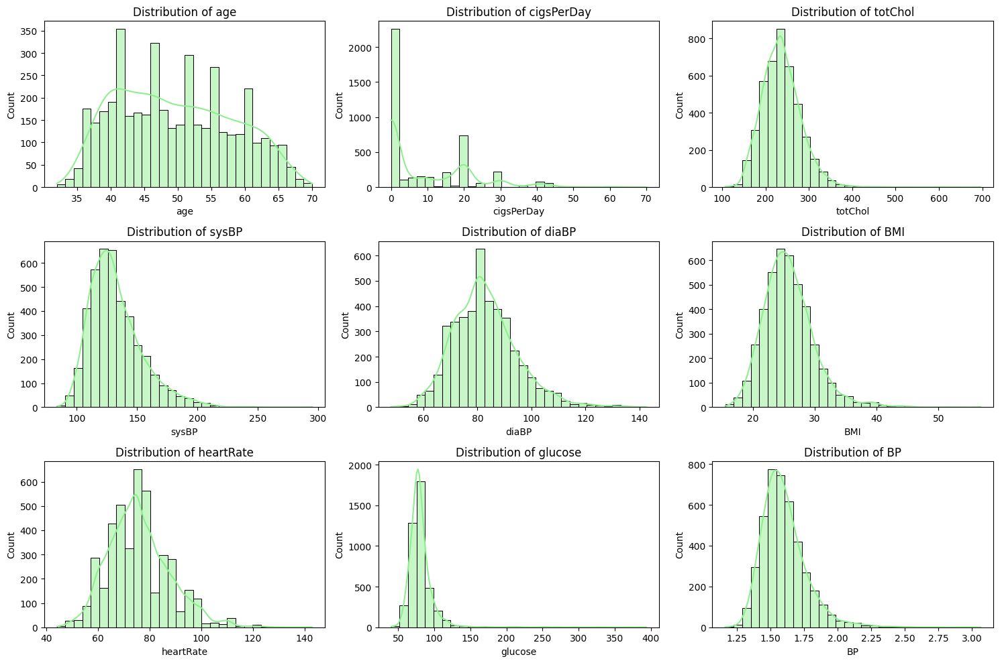

In [ ]:
# List of numerical columns
numerical_columns = ['age', 'cigsPerDay', 'totChol', 'sysBP', 'diaBP', 'BMI', 'heartRate', 'glucose', 'BP']

# Plot histograms and density plots for numerical variables
plt.figure(figsize=(15, 10))
for i, col in enumerate(numerical_columns, 1):
    plt.subplot(3, 3, i)
    sns.histplot(data[col], kde=True, color='lightgreen', bins=30)
    plt.title(f'Distribution of {col}')
plt.tight_layout()
plt.show()

### 2.2 Categorical Variables
Next, we explored the distribution of all categorical variables.

The number of current smokers and nonsmokers was nearly equal, with nonsmokers somewhat more common. The majority of people didn’t take blood pressure medicine (BPMeds). Although most people did not have prevalent hypertension, a considerable proportion did. Diabetes affected a small percentage of the population.

The dataset had more females than males. A relatively small percentage of people had suffered a previous stroke. In terms of education, only a few people had a postgraduate education, a small percentage of people had only completed primary school, the majority of people were uneducated. prevalentStroke_yes:

The majority of people had never had a heart attack. The target variable had a large class imbalance in this distribution. Such imbalances could make modeling difficult since models could become biased toward anticipating the majority class. It was critical to keep this in mind while creating and evaluating models, and to think about tactics like resampling or utilizing specific assessment criteria.

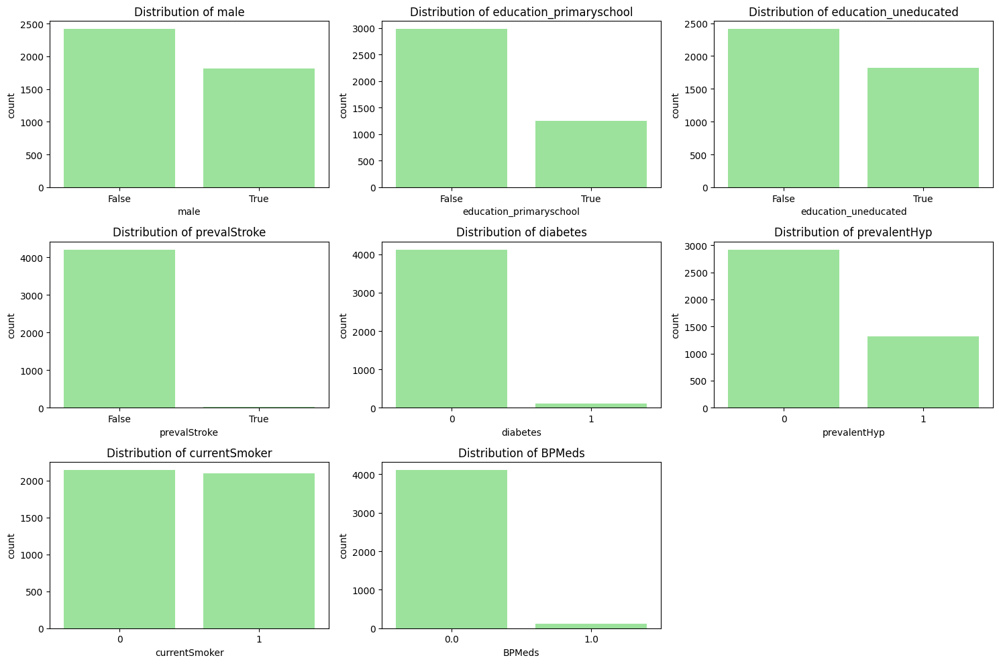

In [ ]:
# List of categorical columns
categorical_columns = ['male', 'education_primaryschool', 'education_uneducated', 'prevalStroke', 'diabetes', 'prevalentHyp', 'currentSmoker', 'BPMeds']

# Plot bar plots for categorical variables
plt.figure(figsize=(15, 10))
for i, col in enumerate(categorical_columns, 1):
    plt.subplot(3, 3, i)
    sns.countplot(x=data[col], color='lightgreen')
    plt.title(f'Distribution of {col}')
plt.tight_layout()
plt.show()

### 2.3 Target variable vs numeric variables
To better understand the relationships between the variables and target, we started with boxplots: numeric variables vs target.

Patients who had had a heart attack were usually older. There did not appear to be a significant difference between the two groups in the number of cigarettes smoked each day. Those who had had a heart attack had a slightly higher median total cholesterol level.

Patients who had a heart attack had greater systolic blood pressure and diastolic blood pressure. As a result, those who had had a heart attack had a slightly higher systolic to diastolic blood pressure ratio. The distribution of Body Mass Index appeared to be similar in both groups. There was no discernible difference in heart rate between the two groups. Glucose levels appeared to be higher in persons who had had a heart attack.

The visualizations revealed which characteristics could be major predictors of the occurrence of heart attacks. It was important to note, however, that correlation did not imply causality. However, the plots confirmed the general knowledge that people with a stroke were older than 45 years, had not had healthy lifestyle and had problems with blood pressure.

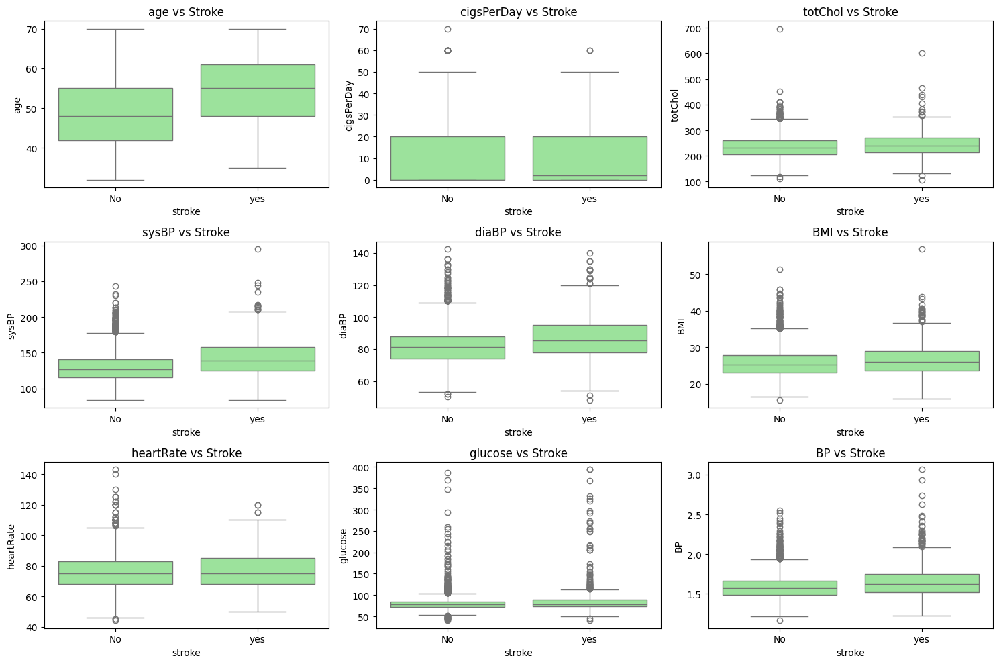

In [ ]:
numerical_columns = ['age', 'cigsPerDay', 'totChol', 'sysBP', 'diaBP', 'BMI', 'heartRate', 'glucose', 'BP']

# Plot boxplots for numerical variables vs target variable
plt.figure(figsize=(15, 10))
for i, col in enumerate(numerical_columns, 1):
    plt.subplot(3, 3, i)
    sns.boxplot(x='stroke', y=col, data=data, color='lightgreen')  # Pass `data=data`
    plt.title(f'{col} vs Stroke')
plt.tight_layout()
plt.show()

### 2.3 Target variable vs numeric variables
To better understand the relationships between the variables and target, we started with boxplots: numeric variables vs target.

Patients who had had a heart attack were usually older. There did not appear to be a significant difference between the two groups in the number of cigarettes smoked each day. Those who had had a heart attack had a slightly higher median total cholesterol level.

Patients who had a heart attack had greater systolic blood pressure and diastolic blood pressure. As a result, those who had had a heart attack had a slightly higher systolic to diastolic blood pressure ratio. The distribution of Body Mass Index appeared to be similar in both groups. There was no discernible difference in heart rate between the two groups. Glucose levels appeared to be higher in persons who had had a heart attack.

The visualizations revealed which characteristics could be major predictors of the occurrence of heart attacks. It was important to note, however, that correlation did not imply causality. However, the plots confirmed the general knowledge that people with a stroke were older than 45 years, had not had healthy lifestyle and had problems with blood pressure.

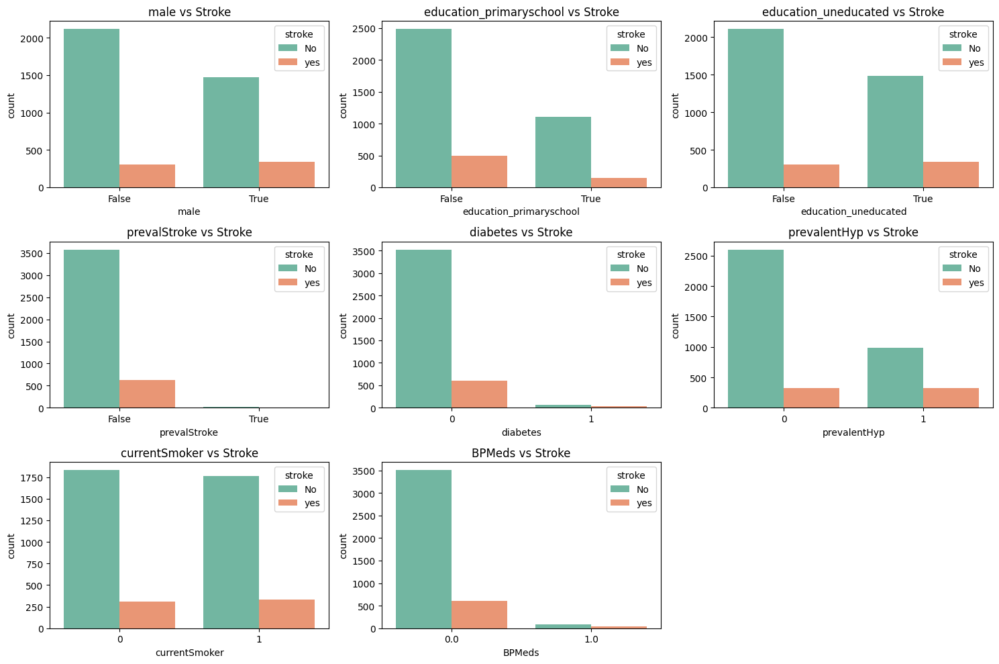

In [ ]:
# Plot bar plots for categorical variables vs target variable
plt.figure(figsize=(15, 10))
for i, col in enumerate(categorical_columns, 1):
    plt.subplot(3, 3, i)
    sns.countplot(x=data[col], hue='stroke', data=data, palette='Set2')
    plt.title(f'{col} vs Stroke')
plt.tight_layout()
plt.show()

### 2.5 Correlation
To understand the relationships between features, we built the correlation matrix.

Age had a positive association with sysBP, diaBP, and totChol, showing that as people got older, their blood pressure and cholesterol levels rose. CigsPerDay had no significant relationships with any other variables which was unusual, the general knowledge connects smoking with heart diseases.

sysBP and diaBP were substantially positively associated as they both assessed blood pressure. As a result, the systolic to diastolic blood pressure ratio had a high positive association with sysBP and a strong negative correlation with diaBP. Other correlations were modest, indicating that there were just a few linear associations between those variables.

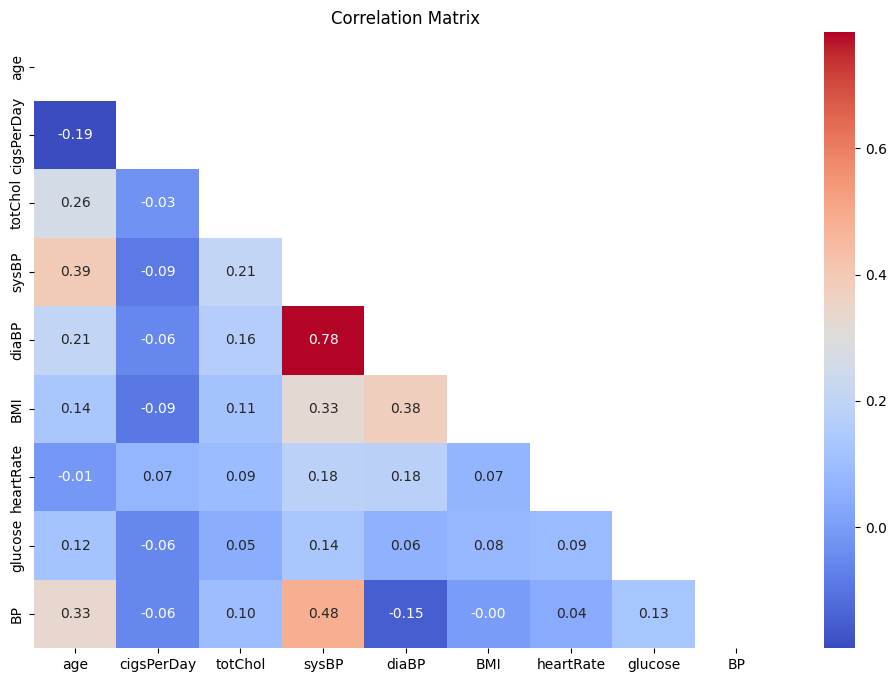

In [ ]:
# Compute correlation matrix
corr_matrix = data[numerical_columns].corr()

# Getting the Upper Triangle of the co-relation matrix
matrix = np.triu(corr_matrix)

# Plot heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, mask=matrix, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Matrix")
plt.show()

## 3. Split data

## 3.1 SVM
Finally, we split our data into train (75%) and test (25%) datasets to evaluate model performance before we proceeded to prediction. The train data contained 3179 records, test data 1059.

The response variable had a balance of 85% for 0 response and 15% for 1 response. For the further analysis, it could be an option to try balance the response variable.

With imbalanced data, most machine learning models predicted the majority class more efficiently than the minority class. To address this behavior, we utilized SMOTE() function the data in order to achieve higher accuracy rates between classes. The SMOTE function oversampled the minority class by using bootstrapping and k-nearest neighbor to synthetically create additional observations of that event. We tried to run models with imbalanced data and without.

In [ ]:
# Split data into features (X) and target (y)
X = data.drop('stroke', axis=1)
y = data['stroke']

# Split into train (75%) and test (25%) sets
X_train_svm, X_test_svm, y_train_svm, y_test_svm = train_test_split(X, y, test_size=0.25, random_state=42)

# Check dimensions of train and test sets
print(f"Train data shape: {X_train_svm.shape}, {y_train_svm.shape}")
print(f"Test data shape: {X_test_svm.shape}, {y_test_svm.shape}")

# Check class distribution in original, train, and test sets
print("Original class distribution:")
print(y.value_counts(normalize=True) * 100)

print("\nTrain class distribution:")
print(y_train_svm.value_counts(normalize=True) * 100)

print("\nTest class distribution:")
print(y_test_svm.value_counts(normalize=True) * 100)

Train data shape: (3178, 18), (3178,)
Test data shape: (1060, 18), (1060,)
Original class distribution:
stroke
No     84.804153
yes    15.195847
Name: proportion, dtype: float64

Train class distribution:
stroke
No     84.518565
yes    15.481435
Name: proportion, dtype: float64

Test class distribution:
stroke
No     85.660377
yes    14.339623
Name: proportion, dtype: float64


The training data was normalized in the procedure outlined by modifying each feature’s range to fall between 0 and 1, preventing bias from different scales and ensuring that each feature contributed equally to the model. For algorithms like SVM that are sensitive to the amount of data, this step is essential. The test data underwent a similar transformation after the training data had been normalized. To preserve consistency and model validity when making predictions on fresh, untested data, the transformation parameters from the training data should normally be applied to the test data. Better performance and more accurate predictions result from normalizing the SVM model to operate under the assumption that all features have the same scale.

In [ ]:
# Initialize the scaler
scaler = MinMaxScaler()

# Fit the scaler on the training data and transform both train and test data
X_train_scaled = scaler.fit_transform(X_train_svm)
X_test_scaled = scaler.transform(X_test_svm)

# Convert scaled arrays back to DataFrames
X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train_svm.columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test_svm.columns)

# Display the first few rows of scaled training data
print(X_train_scaled.head())

        age  currentSmoker  cigsPerDay  BPMeds  prevalentHyp  diabetes  \
0  0.289474            1.0    0.166667     0.0           0.0       0.0   
1  0.473684            1.0    0.333333     0.0           0.0       0.0   
2  0.131579            0.0    0.000000     0.0           0.0       0.0   
3  0.421053            1.0    0.333333     0.0           0.0       0.0   
4  0.842105            0.0    0.000000     0.0           1.0       0.0   

    totChol     sysBP     diaBP       BMI  heartRate   glucose  male  \
0  0.275042  0.262411  0.521739  0.214251   0.326531  0.087571   0.0   
1  0.261460  0.144208  0.173913  0.164324   0.408163  0.087571   1.0   
2  0.098472  0.115839  0.293478  0.152690   0.306122  0.121469   0.0   
3  0.302207  0.153664  0.358696  0.183228   0.561224  0.050847   1.0   
4  0.112054  0.286052  0.369565  0.169656   0.153061  0.104520   0.0   

   education_postgraduate  education_primaryschool  education_uneducated  \
0                     0.0                     

With imbalanced data, most machine learning models predicted the majority class more efficiently than the minority class. To address this behavior, we utilized SMOTE() function the data in order to achieve higher accuracy rates between classes. The SMOTE function oversampled the minority class by using bootstrapping and k-nearest neighbor to synthetically create additional observations of that event. We tried to run models with imbalanced data and without.

In [ ]:
# Apply SMOTE to the training data
smote = SMOTE(random_state=42)
X_train_smote_svm, y_train_smote_svm = smote.fit_resample(X_train_scaled, y_train_svm)

# Check class distribution after SMOTE
print("Class distribution after SMOTE:")
print(pd.Series(y_train_smote_svm).value_counts(normalize=True) * 100)

Class distribution after SMOTE:
stroke
No     50.0
yes    50.0
Name: proportion, dtype: float64


## 3.2 Random Forest

Finally, we split our data into train (75%) and test (25%) datasets to evaluate model performance before we proceeded to prediction. The train data contained 3179 records, test data 1059.

The response variable had a balance of 85% for 0 response and 15% for 1 response. For the further analysis, it could be an option to try balance the response variable.

With imbalanced data, most machine learning models predicted the majority class more efficiently than the minority class. To address this behavior, we utilized SMOTE() function the data in order to achieve higher accuracy rates between classes. The SMOTE function oversampled the minority class by using bootstrapping and k-nearest neighbor to synthetically create additional observations of that event. We tried to run models with imbalanced data and without.

In [ ]:
# Split data into features (X) and target (y)
X = data.drop('stroke', axis=1)
y = data['stroke']

# Split into train (75%) and test (25%) sets
X_train_rf, X_test_rf, y_train_rf, y_test_rf = train_test_split(X, y, test_size=0.25, random_state=42)

# Check dimensions of train and test sets
print(f"Train data shape: {X_train_rf.shape}, {y_train_rf.shape}")
print(f"Test data shape: {X_test_rf.shape}, {y_test_rf.shape}")

# Check class distribution in original, train, and test sets
print("Original class distribution:")
print(y.value_counts(normalize=True) * 100)

print("\nTrain class distribution:")
print(y_train_rf.value_counts(normalize=True) * 100)

print("\nTest class distribution:")
print(y_test_rf.value_counts(normalize=True) * 100)

Train data shape: (3178, 18), (3178,)
Test data shape: (1060, 18), (1060,)
Original class distribution:
stroke
No     84.804153
yes    15.195847
Name: proportion, dtype: float64

Train class distribution:
stroke
No     84.518565
yes    15.481435
Name: proportion, dtype: float64

Test class distribution:
stroke
No     85.660377
yes    14.339623
Name: proportion, dtype: float64


The SMOTE() function was applied to the train data in order to achieve higher accuracy rates between classes.

In [ ]:
# Apply SMOTE to the training data
smote = SMOTE(random_state=42)
X_train_smote_rf, y_train_smote_rf = smote.fit_resample(X_train_rf, y_train_rf)

# Check class distribution after SMOTE
print("Class distribution after SMOTE:")
print(pd.Series(y_train_smote_rf).value_counts(normalize=True) * 100)

Class distribution after SMOTE:
stroke
No     50.0
yes    50.0
Name: proportion, dtype: float64


## 4. Models

### 4.1 SVM
The purpose of the Support Vector Machine (SVM) model was to predict the likelihood of stroke in patients; a prediction of 1 denoted the presence of a stroke, while a prediction of 0 denoted its absence. In building the model, the SVM was trained with a linear kernel to identify the hyperplane that best divides the feature space into classes denoting outcomes that resulted in a stroke and those that did not.

A 10-fold cross-validation technique was used to fine-tune the parameters in order to identify the ideal cost parameter, which managed the trade-off between minimizing the complexity of the model and obtaining a low error on the training set. A moderate level of penalty for misclassified points was found to be optimal for this model, as evidenced by the best performance observed at a cost of 100, when the cost parameter was varied across a range of values (0.001, 0.01, 0.1, 1, 5, 10, 100).

In [ ]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.metrics import confusion_matrix, classification_report, roc_auc_score, roc_curve
import pandas as pd
import numpy as np

# Define the parameter grid for tuning
param_grid = {'C': [0.001, 0.01, 0.1, 1, 5, 10, 100]}

# Initialize the SVM model with a linear kernel
svm_model = SVC(kernel='linear', probability=True, random_state=42)

# Perform grid search with 10-fold cross-validation
grid_search = GridSearchCV(svm_model, param_grid, cv=10, scoring='accuracy')
grid_search.fit(X_train_smote_svm, y_train_smote_svm)

# Get the best model
best_model = grid_search.best_estimator_

# Print the best parameters and performance
print("Best Parameters:", grid_search.best_params_)
print("Best Cross-Validation Accuracy:", grid_search.best_score_)

Best Parameters: {'C': 100}
Best Cross-Validation Accuracy: 0.6725613175219621


An independent test set was used to assess the model’s performance, and the findings were as follows:

Accuracy: 0.62, meaning that for roughly two thirds of the patients in the test set, the model accurately predicted their stroke status.

Sensitivity: 0.70, indicating that the model was able to accurately identify patients who were stroke victims.

Specificity: 0.61, which showed that the model could correctly identify non stroke patients.

Precision: 0.23, how many of the predicted stroke patients actually had a stroke, not the non-stroke patients.

F1 Score: 0.35; indicated that the model was not fully capturing the class 1 (patients with stroke). This score strikes a balance between sensitivity and precision.

ROC: 73% for the area under the ROC curve (AUC) suggested that the model had a moderate ability to distinguish between positive and negative classes.

In [ ]:
# Predict on the test set
y_pred = best_model.predict(X_test_scaled)

# Evaluate the model
conf_matrix = confusion_matrix(y_test_svm, y_pred)
classification_rep = classification_report(y_test_svm, y_pred)
roc_auc = roc_auc_score(y_test_svm, best_model.predict_proba(X_test_scaled)[:, 1])

# Print the results
print("Confusion Matrix:")
print(conf_matrix)

print("\nClassification Report:")
print(classification_rep)

print("\nROC AUC Score:", roc_auc)

Confusion Matrix:
[[553 355]
 [ 45 107]]

Classification Report:
              precision    recall  f1-score   support

          No       0.92      0.61      0.73       908
         yes       0.23      0.70      0.35       152

    accuracy                           0.62      1060
   macro avg       0.58      0.66      0.54      1060
weighted avg       0.83      0.62      0.68      1060


ROC AUC Score: 0.7303863320194761


In [ ]:
# Calculate metrics
accuracy = accuracy_score(y_test_svm, y_pred)
sensitivity = recall_score(y_test_svm, y_pred, pos_label='yes')
specificity = recall_score(y_test_svm, y_pred, pos_label='No')
precision = precision_score(y_test_svm, y_pred, pos_label='yes')
f1 = f1_score(y_test_svm, y_pred, pos_label='yes')

# Print the metrics
print("Accuracy:", accuracy)
print("Sensitivity (Recall):", sensitivity)
print("Specificity:", specificity)
print("Precision:", precision)
print("F1 Score:", f1)

Accuracy: 0.6226415094339622
Sensitivity (Recall): 0.7039473684210527
Specificity: 0.6090308370044053
Precision: 0.23160173160173161
F1 Score: 0.3485342019543974


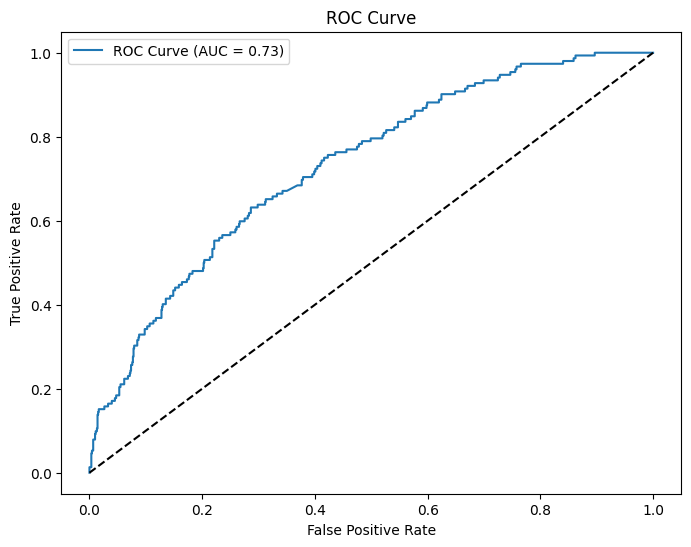

In [ ]:
# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test_svm, best_model.predict_proba(X_test_scaled)[:, 1], pos_label='yes')  # Specify 'yes' as the positive class

# Calculate AUC score
roc_auc = roc_auc_score(y_test_svm, best_model.predict_proba(X_test_scaled)[:, 1])

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f"ROC Curve (AUC = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.show()

### 4.3 Random Forest
Next, we tried the Random Forest Regression model with 200 trees. The variables sysBP, diaBP were dropped, the variable BP was used instead.

In [ ]:
# Drop sysBP and diaBP columns
X_train_smote_rf = X_train_smote_rf.drop(['sysBP', 'diaBP'], axis=1)
X_test_rf = X_test_rf.drop(['sysBP', 'diaBP'], axis=1)

# Initialize the Random Forest model
rf_model = RandomForestClassifier(n_estimators=200, random_state=42)

# Train the model
rf_model.fit(X_train_smote_rf, y_train_smote_rf)

RandomForestClassifier(n_estimators=200, random_state=42)

The accuracy of the model was 82%.

Sensitivity: The model correctly identified only 13% of the actual stroke patients (true positives).

Specificity: The model correctly identified 93% of the actual non-stroke patients (true negatives).

Precision:0.23, meaning that 23% of the patients predicted to have a stroke actually had a stroke. The remaining 77% of the predicted stroke patients were false positives (incorrectly predicted as stroke patients).

F1 Score: 0.17; The F1 score is very low, indicating that the model struggles to balance precision and sensitivity. This suggests poor performance in capturing the stroke patients (positive class).

ROC: 66% for the area under the ROC curve (AUC) suggested that the model had a moderate ability to distinguish between positive and negative classes.

In [ ]:
# Predict on the test set
y_pred_rf = rf_model.predict(X_test_rf)

# Evaluate the model
conf_matrix = confusion_matrix(y_test_rf, y_pred_rf)
classification_rep = classification_report(y_test_rf, y_pred_rf)
roc_auc = roc_auc_score(y_test_rf, rf_model.predict_proba(X_test_rf)[:, 1])

# Print the results
print("Confusion Matrix:")
print(conf_matrix)

print("\nClassification Report:")
print(classification_rep)

print("\nROC AUC Score:", roc_auc)

# Calculate additional metrics
accuracy = accuracy_score(y_test_rf, y_pred_rf)
sensitivity = recall_score(y_test_rf, y_pred_rf, pos_label='yes')
specificity = recall_score(y_test_rf, y_pred_rf, pos_label='No')
precision = precision_score(y_test_rf, y_pred_rf, pos_label='yes')
f1 = f1_score(y_test_rf, y_pred_rf, pos_label='yes')


# Print the metrics
print("Accuracy:", accuracy)
print("Sensitivity (Recall):", sensitivity)
print("Specificity:", specificity)
print("Precision:", precision)
print("F1 Score:", f1)

Confusion Matrix:
[[844  64]
 [132  20]]

Classification Report:
              precision    recall  f1-score   support

          No       0.86      0.93      0.90       908
         yes       0.24      0.13      0.17       152

    accuracy                           0.82      1060
   macro avg       0.55      0.53      0.53      1060
weighted avg       0.77      0.82      0.79      1060


ROC AUC Score: 0.6561485624855089
Accuracy: 0.8150943396226416
Sensitivity (Recall): 0.13157894736842105
Specificity: 0.9295154185022027
Precision: 0.23809523809523808
F1 Score: 0.1694915254237288


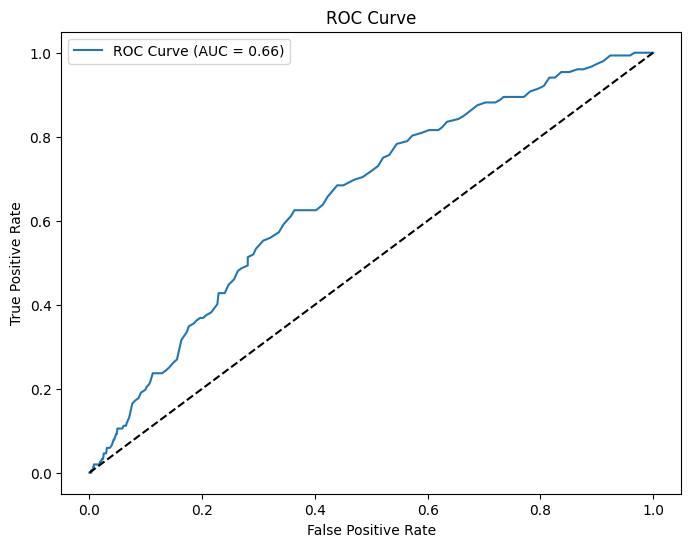

In [ ]:
# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test_rf, rf_model.predict_proba(X_test_rf)[:, 1], pos_label='yes')

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f"ROC Curve (AUC = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.show()

In [ ]:
# Build a neural network with Keras
keras_model = Sequential([
    Dense(64, activation='relu', input_shape=(X_train.shape[1],)),
    Dropout(0.2),
    Dense(32, activation='relu'),
    Dropout(0.2),
    Dense(1, activation='sigmoid')
])

# Compile the model
keras_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
history = keras_model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2)

# Evaluate the model
loss, accuracy = keras_model.evaluate(X_test, y_test)
print(f"Keras Test Accuracy: {accuracy:.4f}")

In [ ]:
# Convert data to PyTorch tensors
X_train_torch = torch.tensor(X_train, dtype=torch.float32)
X_test_torch = torch.tensor(X_test, dtype=torch.float32)
y_train_torch = torch.tensor(y_train.values, dtype=torch.float32).view(-1, 1)
y_test_torch = torch.tensor(y_test.values, dtype=torch.float32).view(-1, 1)

# Create DataLoader
train_dataset = TensorDataset(X_train_torch, y_train_torch)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

# Define the neural network
class HeartDiseaseModel(nn.Module):
    def __init__(self, input_size):
        super(HeartDiseaseModel, self).__init__()
        self.fc1 = nn.Linear(input_size, 64)
        self.fc2 = nn.Linear(64, 32)
        self.fc3 = nn.Linear(32, 1)
        self.dropout = nn.Dropout(0.2)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = self.dropout(x)
        x = torch.relu(self.fc2(x))
        x = self.dropout(x)
        x = torch.sigmoid(self.fc3(x))
        return x

# Initialize model, loss, and optimizer
pytorch_model = HeartDiseaseModel(X_train.shape[1])
criterion = nn.BCELoss()
optimizer = optim.Adam(pytorch_model.parameters(), lr=0.001)

# Train the model
for epoch in range(50):
    for batch_X, batch_y in train_loader:
        optimizer.zero_grad()
        outputs = pytorch_model(batch_X)
        loss = criterion(outputs, batch_y)
        loss.backward()
        optimizer.step()
    print(f"Epoch {epoch+1}, Loss: {loss.item():.4f}")

# Evaluate the model
with torch.no_grad():
    outputs = pytorch_model(X_test_torch)
    predicted = (outputs > 0.5).float()
    accuracy = (predicted == y_test_torch).float().mean()
    print(f"PyTorch Test Accuracy: {accuracy:.4f}")

In [ ]:
# Save models using joblib
joblib.dump(svm_model, 'svm_model.pkl')
joblib.dump(rf_model, 'rf_model.pkl')
joblib.dump(keras_model, 'keras_model.pkl')
joblib.dump(pytorch_model, 'pytorch_model.pkl')

# Load models
svm_model_loaded = joblib.load('svm_model.pkl')
rf_model_loaded = joblib.load('rf_model.pkl')
keras_model_loaded = joblib.load('keras_model.pkl')
pytorch_model_loaded = joblib.load('pytorch_model.pkl')

In [ ]:
# Save models to S3
s3.upload_file('svm_model.pkl', 'my-bucket', 'models/svm_model.pkl')
s3.upload_file('rf_model.pkl', 'my-bucket', 'models/rf_model.pkl')
s3.upload_file('keras_model.pkl', 'my-bucket', 'models/keras_model.pkl')
s3.upload_file('pytorch_model.pkl', 'my-bucket', 'models/pytorch_model.pkl')